# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = 'traffic-signs-data/train.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = len(y_train)

# TODO: Number of testing examples.
n_test = len(y_test)

# TODO: What's the shape of an traffic sign image?
image_shape = X_train.shape[1:]

# TODO: How many unique classes/labels there are in the dataset.
n_classes = len(set(y_train))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [3]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
plt.style.use('ggplot')
# Visualizations will be shown in the notebook.
%matplotlib inline

In [4]:
#import signnames.csv which contains information about label
sign_name = {}
with open('signnames.csv', mode = 'r') as f:
    next(f)
    for line in f:
        splited_line = line.split(',')
        sign_name[int(splited_line[0])] = splited_line[1]

In [5]:
# separate the indices of each traffic sign in the train and test set and 
# store them in indices_of_label and  indices_of_label_test
def ind_label(y):
    indices_of_label = {}
    for i in range(43):
        indices_of_label[i] = []
    for i in range(len(y)):
        indices_of_label[y[i]].append(i)
    return indices_of_label

indices_of_label = ind_label(y_train)
indices_of_label_test = ind_label(y_test)

num_of_label = [len(indices_of_label[i]) for i in range(43)]
num_of_label_test = [len(indices_of_label_test[i]) for i in range(43)]

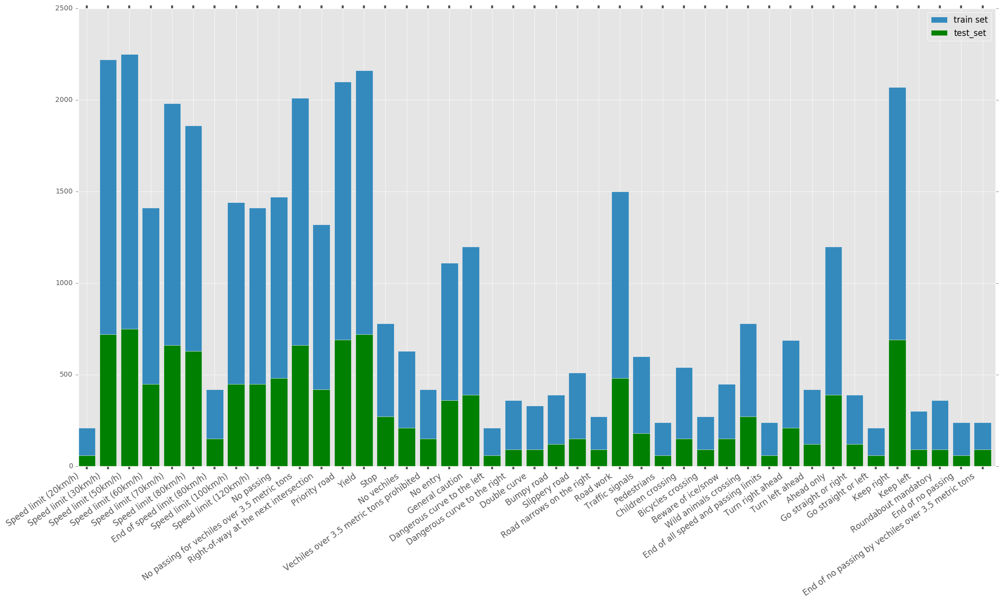

In [6]:
# Plot number of each traffic sign in train set
import numpy as np
fig, ax = plt.subplots(figsize = (24, 12) )

plt.bar(range(43), num_of_label, label = 'train set')
plt.bar(range(43), num_of_label_test, color = 'g', label = 'test_set')
plt.xticks(np.arange(43) + 0.4 , [sign_name[i] for i in range(43)], rotation='35', fontsize = 12, ha = 'right')
plt.xlim([0,43])
ax.xaxis.set_tick_params(width=3)
plt.legend();

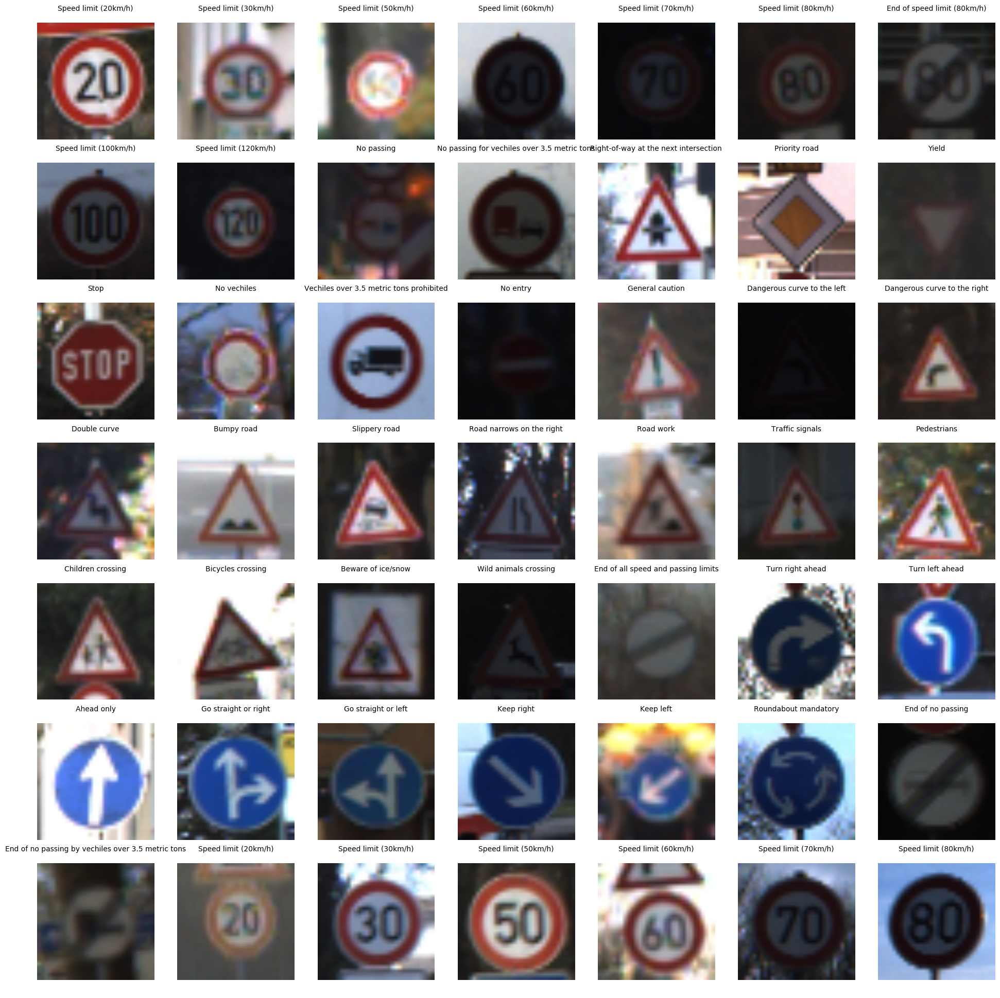

In [7]:
# Randomly choose and plot traffic sign images
fig, axes = plt.subplots(7,7, figsize = (24, 24))
plt.axis('off')
for i in range(49):
    idx = np.random.choice(indices_of_label[i%43])
    axes.flat[i].imshow(X_train[idx])
    axes.flat[i].set_title(sign_name[i%43], fontsize = 10)
    axes.flat[i].axis('off')

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

This is the answer for both question 1 and 2.

My pre-processing techniques and data augmentation are as follows

 1. I converted all image in both train and test data to YUV and applied Contrast Limited Adaptive Histogram Equalization to Y channel then converted back the images to RGB. This will improve contrast and brightness in all images. 

 2. Cropped the images to (28,28,3), randomly for training centrally for evaluation.

 3. Randomly adjusted the brightness and contrast for training.
 
 4. Subtracted off the mean and divide by the variance of the pixels to make the model insensitive to dynamic range

Step 1 (applied Contrast Limited Adaptive Histogram Equalization) is done by using OpenCV (function `process(img)` below). All steps 2,3,4 are done internally in tensorflow graph. Since these processes are done in the input pipeline of tensorflow, new data are constantly generated as long as we train the model. This will make the model more robust.

For evaluation, I randomly took 20% data of each traffic sign to form a validation set.

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

The final architecture is (to visualize the architecture please do download two images 'model.png' and 'block.png' and put them in same directory with this file)

![model](./model.png)

where each block is designed as follows

![block](./block.png)

Also, L2 regularization is applied for the fully connected layer FC

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

I used Adam optimizer with initial learning rate is 0.001. Learing rate is reduced by a decay rate 0.9 after each decay step 100. The batch size is 512, all the dropout probability is of 0.5 and the regularization coefficient for FC is 0.004. All the variales are initiated by Xavier initiation.    

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

This architecture is inspired by inception model: each clock is formed by concatenating two sequences of convolution net, and let the training process decide which sequence is better for the classification.

Below is the process I took to come up with this final model
+ I started the model by combining 4 blocks of the form: ... + conv 3*3 + ReLu + conv 3*3 + Relu + Maxpool + ... follows by two fully connected layers. Without any data preprocessing, this type of model brought me 100% accuracy on the train set, 99% acc on val set but only 94-95% acc on test set. It seem that the model learnt so much irrelevant features and became overfitting.
+ On the following attempt, by randomly rotating and transforming from each image, I made the training set 5 time bigger before training. This brough me 96-97% on the test set.
+ I then used input pipeline of tensorflow and modified the model by concatening two sequences of cov nets (similar as the final model but without dropout and batch norm). This time, I got 97-98% on the test set.
+ I then added dropout, and used L2 regularization for fully connected layer. Consequently, the test accuracy inceased to 99%.
+ I tried batch normalization and Adaptive Histogram Equalization, It didn't bring the significant improvement for the test acc. But It make the trainining process converge faster. So I decided to keep them.    


### Detailed implementation

In [8]:
# Apply Contrast_Limited_Adaptive_Histogram_Equalization to Y channel of all images of both train and test set
import cv2
def process(img):
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    y = yuv[:,:,0]
    # create a CLAHE object 
    clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(3,3))
    y_ = clahe.apply(y)
    yuv[:,:,0] = y_
    img_ = cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)
    return img_

X_train = np.array([process(img) for img in X_train ])
X_test =  np.array([process(img) for img in X_test ])

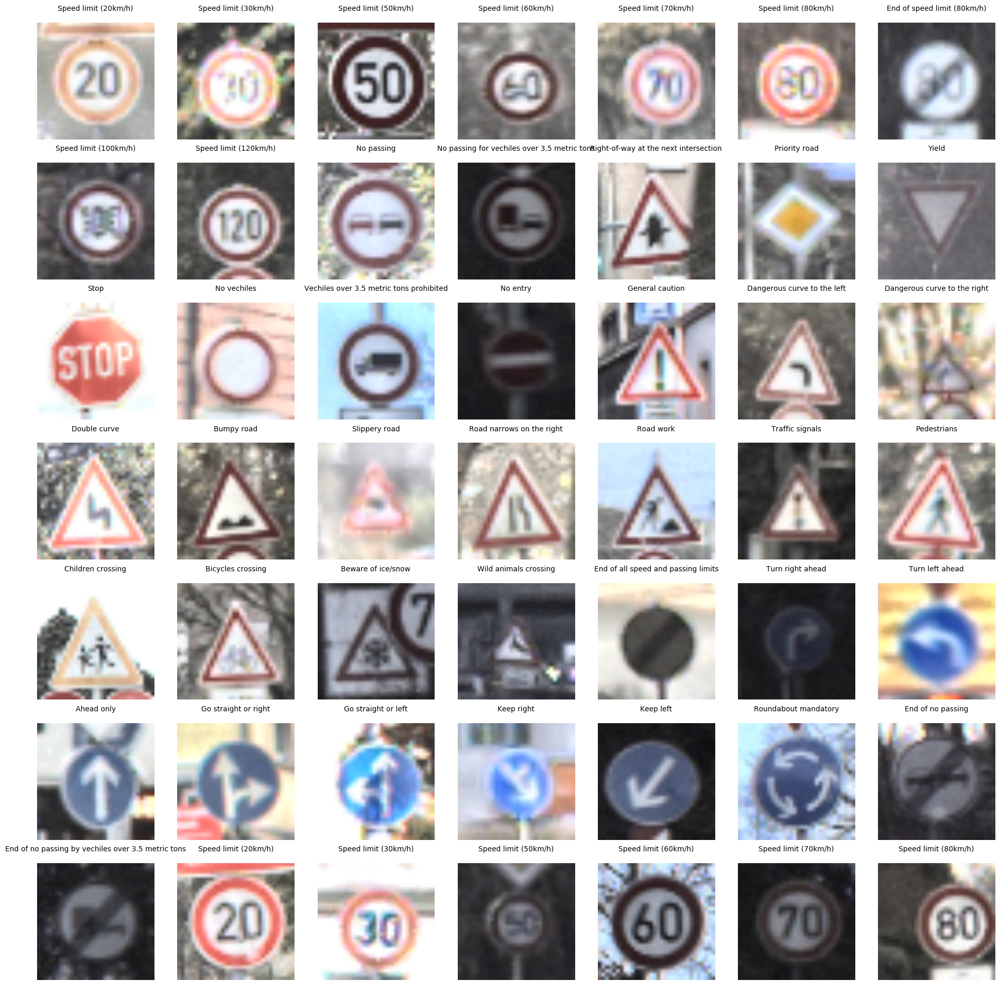

In [9]:
# Plot traffic sign after processing
fig, axes = plt.subplots(7,7, figsize = (24, 24))
plt.axis('off')
for i in range(49):
    idx = np.random.choice(indices_of_label[i%43])
    axes.flat[i].imshow(X_train[idx])
    axes.flat[i].set_title(sign_name[i%43], fontsize = 10)
    axes.flat[i].axis('off')

In [10]:
### Create validation set

def train_val_split(X_train, y_train, num_val = 0.2):
    '''Create validation set by randomly taking 20% of each sign in the train set  
    '''
    indices_of_val = []
    indices_of_train = []
    for i in range(43):
        l = len(indices_of_label[i])
        split_point = int(num_val*l)
        np.random.shuffle(indices_of_label[i])
        indices_of_val += list(indices_of_label[i][:split_point])
        indices_of_train += list(indices_of_label[i][split_point:])
    X_val = X_train[indices_of_val]
    y_val = y_train[indices_of_val]
    X_train_new = X_train[indices_of_train]
    y_train_new = y_train[indices_of_train]
    return X_train_new, y_train_new, X_val, y_val

X_train, y_train, X_val, y_val = train_val_split(X_train, y_train)
print('Num train = ', len(y_train))
print('Num val = ', len(y_val))

Num train =  31368
Num val =  7841


In [11]:
# Convert label to one-hot representation
def to_one_hot(y):
    n_sample = len(y)
    one_hot = np.zeros((n_sample, 43), np.float32)
    one_hot[np.arange(n_sample), y] = 1
    return one_hot

y_train, y_val, y_test = to_one_hot(y_train), to_one_hot(y_val), to_one_hot(y_test)

### Architecture

In [12]:
import tensorflow as tf
import numpy as np

def _variable_with_weight_decay(name, shape, wd):
    """Helper to create an initialized Variable with Xavier initiation and weight decay.

    Args:
        name: name of the variable
        shape: list of ints
        wd: add L2Loss weight decay multiplied by this float

    Returns:
        Variable Tensor
    """
    var = tf.get_variable(name, shape, initializer=tf.contrib.layers.xavier_initializer())

    #if wd is not None:
    weight_decay = tf.mul(tf.nn.l2_loss(var), wd, name='weight_loss')
    tf.add_to_collection('losses', weight_decay)

    return var

def _bias_variable(dim, name = 'biases'):
    """Helper to create bias
    """    
    return tf.get_variable(name, [dim], initializer=tf.constant_initializer(0.0), dtype=tf.float32)

def batch_norm(input, is_training):
    """Helper to create batch normalization layer following by an activation function ReLu 
    """
    bn = tf.contrib.layers.batch_norm(input, is_training=is_training, decay=0.9, center=True, scale=True,
                                      activation_fn=tf.nn.relu, updates_collections=None)
    return bn

def block(input, d_in, d_out, i, is_training):
    """ A block is created by concatenating of two convolution sequences following by a dropout 
    """
    with tf.variable_scope('layer{}'.format(i)) as scope:
        if not is_training:
            tf.get_variable_scope().reuse_variables()

        with tf.variable_scope('conv1') as scope:
            kernel = _variable_with_weight_decay('weights',
                                                 shape=[3, 3, d_in, d_out//2],
                                                 wd=0.0)
            conv = tf.nn.conv2d(input, kernel, [1, 1, 1, 1], padding='SAME')
            biases = _bias_variable(d_out//2)
            pre_activation = tf.nn.bias_add(conv, biases)
            conv1 = batch_norm(pre_activation, is_training)

        with tf.variable_scope('conv2') as scope:
            kernel1 = _variable_with_weight_decay('weights_1',
                                                  shape=[3, 3, d_in, d_out//2],
                                                  wd=0.0)
            conv2_1 = tf.nn.conv2d(input, kernel1, [1, 1, 1, 1], padding='SAME')
            biases1 = _bias_variable(d_out//2, name = 'biases1')
            pre_activation2_1 = tf.nn.bias_add(conv2_1, biases1)
            conv2_1 = batch_norm(pre_activation2_1, is_training)


            kernel2 = _variable_with_weight_decay('weights_2',
                                                  shape=[3, 3, d_out//2, d_out//2],
                                                  wd=0.0)
            conv2_2 = tf.nn.conv2d(conv2_1, kernel2, [1, 1, 1, 1], padding='SAME')
            biases2 = _bias_variable(d_out//2, name = 'biases2')
            pre_activation2_2 = tf.nn.bias_add(conv2_2, biases2)
            conv2_2 = batch_norm(pre_activation2_2, is_training)


        # Concatenate
        layer = tf.concat(3, [conv1, conv2_2])

        # pool1
        pool = tf.nn.max_pool(layer, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1],
                               padding='SAME', name='pool{}'.format(i))

        if is_training:
            pool = tf.nn.dropout(pool, 0.5)
        else:
            pool = tf.nn.dropout(pool, 1.0)
    return pool

def fc(input, d_out, i, flatten, is_training):
    """Fully connected layer
    """
    with tf.variable_scope('fc{}'.format(i)) as scope:
        if not is_training:
            tf.get_variable_scope().reuse_variables()
        # Move everything into depth so we can perform a single matrix multiply.
        if flatten:
            dim = np.prod(input.get_shape().as_list()[1:])
            input = tf.reshape(input, [-1, dim])
        dim = input.get_shape()[-1].value
        weights = _variable_with_weight_decay('weights', shape=[dim, d_out], wd=0.004)
        biases = _bias_variable(d_out)
        pre_activation = tf.matmul(input, weights) + biases
        bn = batch_norm(pre_activation, is_training)

        if is_training:
            bn = tf.nn.dropout(bn, 0.5)
        else:
            bn = tf.nn.dropout(bn, 1.0)

    return(bn)

def softmax(input, flatten, is_training):
    """ softmax layer
    """
    if flatten:
        dim = np.prod(input.get_shape().as_list()[1:])
        input = tf.reshape(input, [-1, dim])
    with tf.variable_scope('softmax_linear') as scope:
        if not is_training:
            tf.get_variable_scope().reuse_variables()
        dim = input.get_shape()[-1].value
        weights = _variable_with_weight_decay('weights', [dim, 43], wd=0.0)
        biases = _bias_variable(43)
        softmax_linear = tf.add(tf.matmul(input, weights), biases, name=scope.name)

    return softmax_linear



def inference(x, is_training):
    """Build the model.

    Args:
        images: Images returned from input_train() or input_test()
        is_training : boolean

    Returns:
        Logits.
    """
    # bloc1
    bn1 = block(x, 3, 128, 1, is_training)
    # bloc2
    bn2 = block(bn1, 128, 256, 2, is_training)
    #bloc3
    bn3 = block(bn2, 256, 512, 3, is_training)
    # fc4
    bn4 = fc(bn3, 1024, 5, True, is_training)
    # softmax
    softmax_linear = softmax(bn4, False, is_training)

    return softmax_linear


In [13]:
# Constant
cropped_height = 28
cropped_width = 28
min_queue_examples = 10000
batch_size = 512
image_size = 32
c_classes = 43
init_learning_rate = 0.001
decay_steps = 100
decay_rate = 0.9
n_classes = 43
summaries_dir = './summary'
max_step = 5000
display_step = 40 

In [14]:
# Input pipeline

def distorted_train(x):
    """ Image processing for training:
        Input: single image
        return: image after processing
    """
    # Covert dtype to float
    reshaped_image = tf.cast(x, tf.float32)

    # Randomly crop a [height, width] section of the image.
    distorted_image = tf.random_crop(reshaped_image, [cropped_height, cropped_width, 3])
    
    # Randomly adjust brightness and contrast
    distorted_image = tf.image.random_brightness(distorted_image, max_delta=63)
    distorted_image = tf.image.random_contrast(distorted_image, lower=0.2, upper=1.8)

    # Subtract off the mean and divide by the variance of the pixels.
    distorted_image = tf.image.per_image_standardization(distorted_image)

    return distorted_image

def distorted_test(x):
    """ Image processing for training:
        Input: single image
        return: image after processing
    """
    # Covert dtype to float
    reshaped_image = tf.cast(x, tf.float32)

    # Crop the central [height, width] of the image.
    resized_image = tf.image.resize_image_with_crop_or_pad(reshaped_image, cropped_width, cropped_height)

    # Subtract off the mean and divide by the variance of the pixels.
    normalized_image = tf.image.per_image_standardization(resized_image)

    return normalized_image

    """ 
    The two functions below takes whole dataset (train, val or test), 
    put each image and label in the dataset to a queue, 
    process each image and return a batch of image and label.
    """

def input_train(x,y):
    input_queue = tf.train.slice_input_producer([x, y], shuffle=False)
    distorted_x = distorted_train(input_queue[0])

    images, label_batch = tf.train.shuffle_batch(
        [distorted_x, input_queue[1]],
        batch_size=batch_size,
        num_threads=8,  
        capacity=min_queue_examples + 3 * batch_size,
        min_after_dequeue=min_queue_examples)

    return images, label_batch

def input_test(x,y, num_split = 3):
    test_size = x.shape[0]
    test_batch_size = (test_size +num_split -1) // num_split
    input_queue = tf.train.slice_input_producer([x, y], shuffle=False)
    distorted_x = distorted_test(input_queue[0])

    images, label_batch = tf.train.batch(
        [distorted_x, input_queue[1]],
        batch_size=test_batch_size,
        capacity= test_batch_size,
        allow_smaller_final_batch = True)

    return images, label_batch

In [15]:
def loss_n_accuracy(x,y, soft_max, is_training):
    if is_training:
        s = 'train_'
    else:
        s = 'val_'
    with tf.variable_scope(s + 'loss') as scope:
        cross_entropy_mean = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(soft_max, y))
        tf.add_to_collection('losses', cross_entropy_mean)
        loss = tf.add_n(tf.get_collection('losses'), name='total_loss')
        tf.summary.scalar('cross_entropy_mean', cross_entropy_mean)
        tf.summary.scalar('loss', loss)
        
    with tf.variable_scope(s + 'accuracy') as scope:
        correct_pred = tf.equal(tf.argmax(soft_max, 1), tf.argmax(y, 1))
        accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))
        tf.summary.scalar('accuracy', accuracy)
    return loss, accuracy

In [16]:
train_batch, train_label = input_train(X_train, y_train)
train_soft_max = inference(train_batch, True)
train_loss, train_accuracy = loss_n_accuracy(train_batch,train_label,train_soft_max, True)

val_batch, val_label = input_test(X_val, y_val, num_split = 2)
val_soft_max = inference(val_batch, False)
val_loss, val_accuracy = loss_n_accuracy(val_batch, val_label, val_soft_max, False)

test_batch, test_label = input_test(X_test, y_test)
test_soft_max = inference(test_batch, False)
test_loss, test_accuracy = loss_n_accuracy(test_batch, test_label, test_soft_max, False)

In [17]:
global_step = tf.Variable(0, trainable=False)
learning_rate = tf.train.exponential_decay(init_learning_rate, global_step, decay_steps, decay_rate, True)
tf.summary.scalar('larning_rate', learning_rate)

update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
with tf.control_dependencies(update_ops):
    train_step = tf.train.AdamOptimizer(learning_rate).minimize(train_loss, global_step)

merged = tf.summary.merge_all()
saver = tf.train.Saver()

### Train model

In [18]:
import time
import os
import shutil
# Delete summary directory every time re_train model 
if os.path.exists(summaries_dir):
    shutil.rmtree(summaries_dir)

def train():
    with tf.Session() as sess:
        start = time.time()
        sess.run(tf.global_variables_initializer())

        train_writer = tf.train.SummaryWriter(summaries_dir, sess.graph)
        
        coord = tf.train.Coordinator()
        threads = tf.train.start_queue_runners(coord=coord, sess=sess)

        n_sample = X_train.shape[0]
        for step in range(1, max_step+1):
            
            epoch = step*batch_size // n_sample + 1 
            summary, batch_loss, batch_acc, val_l, val_a, lr, _ = sess.run(
                [merged, train_loss, train_accuracy, val_loss, val_accuracy, learning_rate, train_step])

            train_writer.add_summary(summary, step)
            
            if step % display_step == 0:
                print('Epoch:{0:>4}  step: {1:>5}  time:{2} '.format(epoch, step, round(time.time() - start)) )
                print('Batch_loss: {0:6.4f}  batch_acc: {1:5.3f}  val_loss: {2:6.4f}  val_acc: {3:5.3f}  learning_rate: {4:7.6f}'.format(batch_loss, batch_acc, val_l, val_a, lr ) )
                
        saver.save(sess, './saved_model.ckpt')

        coord.request_stop()
        coord.join(threads)
train()


Epoch:   1  step:    40  time:123 
Batch_loss: 6.6394  batch_acc: 0.256  val_loss: 14.1577  val_acc: 0.288  learning_rate: 0.001000
Epoch:   2  step:    80  time:230 
Batch_loss: 3.7089  batch_acc: 0.670  val_loss: 7.9808  val_acc: 0.542  learning_rate: 0.001000
Epoch:   2  step:   120  time:338 
Batch_loss: 2.9874  batch_acc: 0.686  val_loss: 5.3008  val_acc: 0.897  learning_rate: 0.000900
Epoch:   3  step:   160  time:449 
Batch_loss: 1.9975  batch_acc: 0.822  val_loss: 3.6774  val_acc: 0.939  learning_rate: 0.000900
Epoch:   4  step:   200  time:557 
Batch_loss: 1.3997  batch_acc: 0.900  val_loss: 2.6978  val_acc: 0.938  learning_rate: 0.000900
Epoch:   4  step:   240  time:665 
Batch_loss: 1.1831  batch_acc: 0.895  val_loss: 2.0748  val_acc: 0.990  learning_rate: 0.000810
Epoch:   5  step:   280  time:774 
Batch_loss: 0.8932  batch_acc: 0.926  val_loss: 1.6346  val_acc: 0.981  learning_rate: 0.000810
Epoch:   6  step:   320  time:883 
Batch_loss: 0.7149  batch_acc: 0.955  val_loss:

### Accuracy on test set

In [18]:
saver = tf.train.Saver()

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, "./saved_model.ckpt")
    print("Model restored.")
    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(coord=coord, sess=sess)
    test_losses = []
    test_accuracies = []

    for i in range(3):
        test_batch_loss, test_batch_acc = sess.run([test_loss, test_accuracy])
        test_losses.append(test_batch_loss)
        test_accuracies.append(test_batch_acc)

    total_test_loss = np.mean(test_losses)
    total_test_acc = np.mean(test_accuracies)
    print('Test_loss: ', total_test_loss, ' Test_acc', total_test_acc)
    
    coord.request_stop()
    coord.join(threads)
    

Model restored.
Test_loss:  0.128783  Test_acc 0.990182


**The model achived 99.0% accuracy on the test set**

### Tensorboard:
Open TensorBoard by using the following command. Note that 

`tensorboard --logdir=./summary`

Note that you can only run Tensorboard after training the model (run `train()`). I didn't upload summary file to github because it's too big.

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

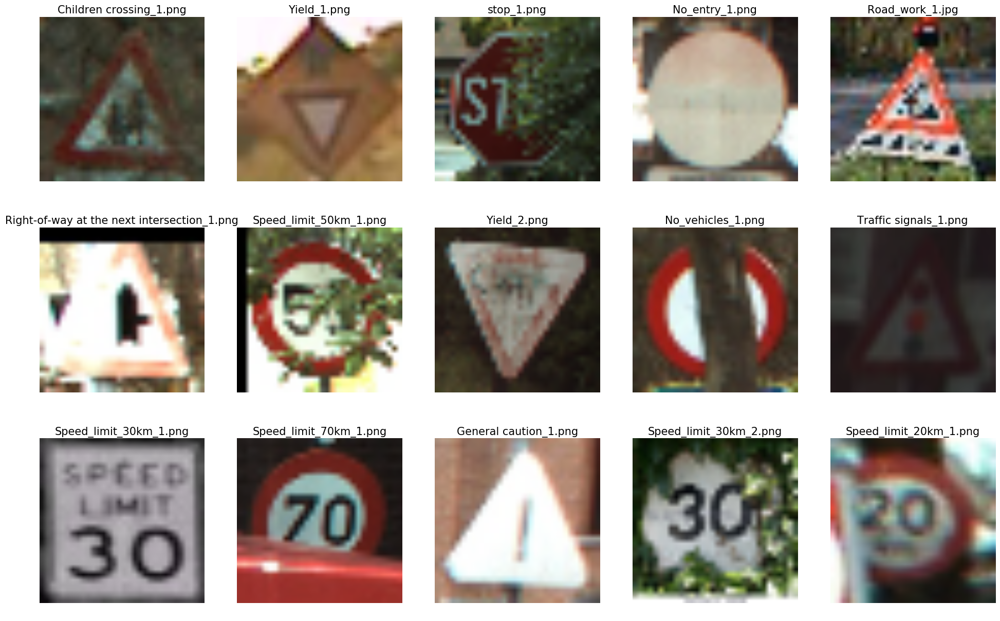

In [19]:
### Load the images and plot them here.

import glob
import matplotlib.image as mpimg
files = glob.glob('./new_data/*.*')
fig, axes = plt.subplots(3, 5, figsize = (24,15) )
for i, file in enumerate(files):
    img = mpimg.imread(file)
    axes.flat[i].imshow(img)
    axes.flat[i].set_title(file[11:], fontsize = 15)
    axes.flat[i].axis('off')

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._

**Answer:**

To test model on new images, I picked 15 traffic sign from the internet. All images are intentionally chosen to be difficult to solve, because I wanted to see how well the model perform on a more general data. For example: 

+ 'Yield_1.png' and 'Speed_limit_30km_1.png' are not the traffic sign of German. Their shape and color are quite different from the German ones. 

+ 'Children crossing_1.png', 'stop_1.png', 'No vechiles_1.png', 'Speed_limit_50km_1.png', 'Speed_limit_30km_2.png' are partially covered by trees.

+ 'No_entry_1.png', 'General caution_1.png' are almost white

...

In [20]:
# Read all images and store them in a numpy.array X
X = cv2.imread(files[0])
X = cv2.cvtColor(X, cv2.COLOR_BGR2RGB)
X = X.reshape(1,32,32,3)
for i in range(1,len(files)):
    img = cv2.imread(files[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.reshape(1,32,32,3)
    X = np.concatenate((X,img), axis = 0)
X_ = np.array([process(img) for img in X])
print(X_.shape)

(15, 32, 32, 3)


In [21]:
# Relaunch the model and do prediction

saver = tf.train.Saver()

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, "./saved_model.ckpt")
    print("Model restored.")
    
    x, y = input_test(X_,np.zeros((15,43)), num_split = 1)
        
    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(coord=coord, sess=sess)
    soft_max = inference(x, False)
    predict = sess.run(soft_max)
    coord.request_stop()
    coord.join(threads)
        
print('Done prediction')

Model restored.
Done prediction


In [22]:
# Convert softmax to probabilities

exp = np.exp(predict)
sum_exp = np.sum(exp, axis=1).reshape(-1,1)
prob = exp/sum_exp
argsort = np.argsort(predict, axis=1)

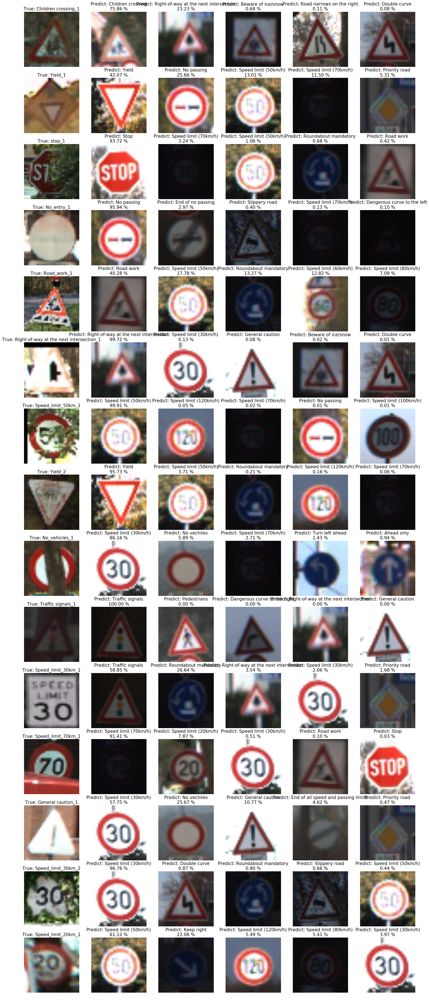

In [23]:
# Plot the ground true image together with top 5 predictions 

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']

fig, axes = plt.subplots(15, 6, figsize = (24,60) )
for r in range(15):
    axes[r,0].imshow(X[r])
    axes[r,0].set_title('True: ' + files[r][11:-4], fontsize = 15)
    axes[r,0].axis('off')    
    
    for c in range(1,6):
        idx = argsort[r,-c]
        p = prob[r,idx]*100 
        axes[r,c].imshow(X_train[indices_of_label[idx][10]])
        axes[r,c].set_title('Predict: ' + sign_name[idx] + '{:.2f} %'.format(p), fontsize = 15)
        axes[r,c].axis('off')    

    

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

Models have predicted correctly 10/15 labels (about 66.67%). This accuracy is quite low comparing to the one of the test set. But This is not unexpected since the data are intentionally chosen to be difficult to recognize. Let's look at some images more carefully:

+ For the two strange "strange" signs: 'Yield_1' and 'Speed_limit_30km_1', the model still recognize the triagle shape inside 'Yield_1' and make a correct prediction with 42.07% certainty. However, it is fail to recognize 'Speed_limit_30km_1'. It's weird that the model is pretty sure 'Speed_limit_30km_1' is a traffic sigmal sign (with 58.85% certainty). It's hard to see connection between these two signs.

+ Both 'No_entry_1', 'General caution_1' are whiten and not correctly predicted. The model make a strong prediction 'No_entry_1' is a no passing sign with 95.94% certainty. It makes sense since these two signs are quite similar. However, it's hard to explain why the model make a prediction with 57.75% certainty that the 'General caution_1' is a speed limit 30km/h. 

+ The model did very well on recognizing of 'Speed_limit_30km_2', 'Speed_limit_50km_1', 'stop_1', 'Children_crossing_1'. All certainty are above 75% even though all these sign are partially coverd by trees.

+ The case 'Speed_limit_20km_1.png' is also interesting. The space on the left of number 2 is covered by some stick make the model recognize the image as speed limit 50 km/h.


### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**

Top k predictions are ploted above. Here I didn't use tf.nn.top_k because it doesn't give back the probabiliies of top k predictions. Instead, I convert soft_max to probabilities and use numpy.argsort to take the top k probabilities.  

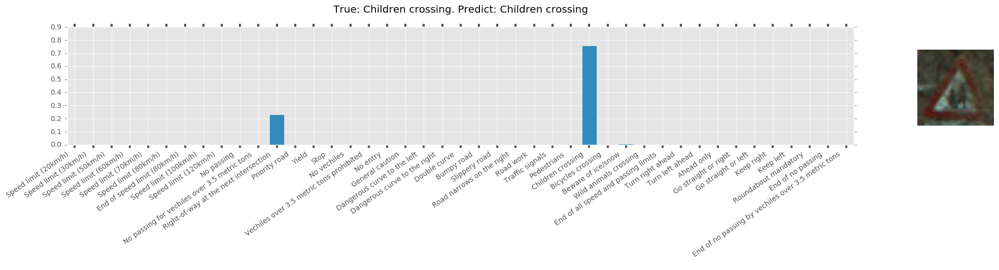

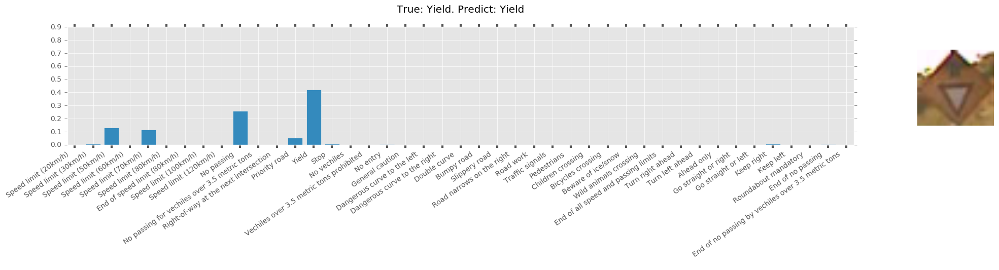

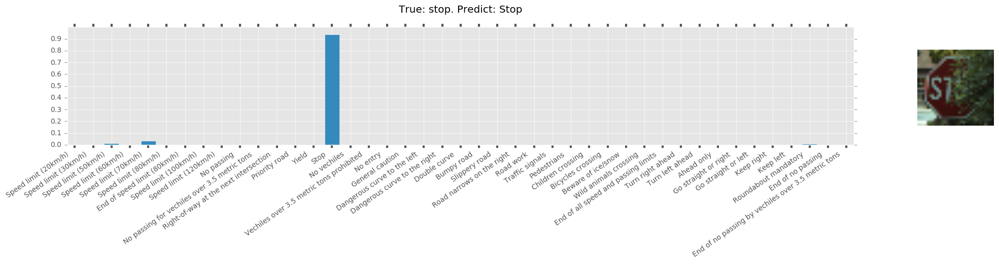

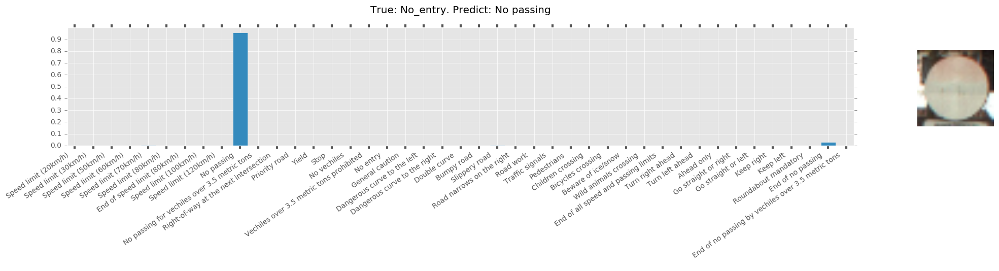

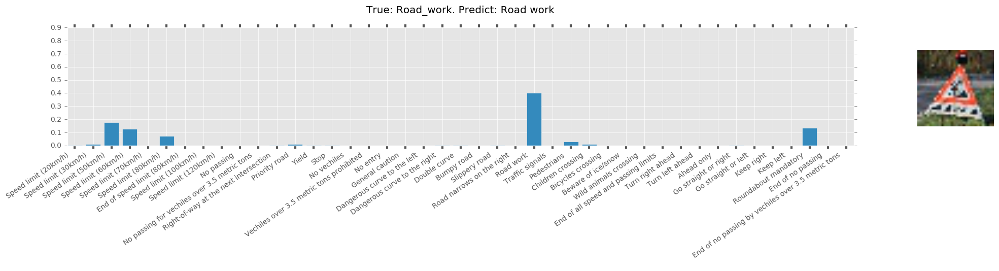

...

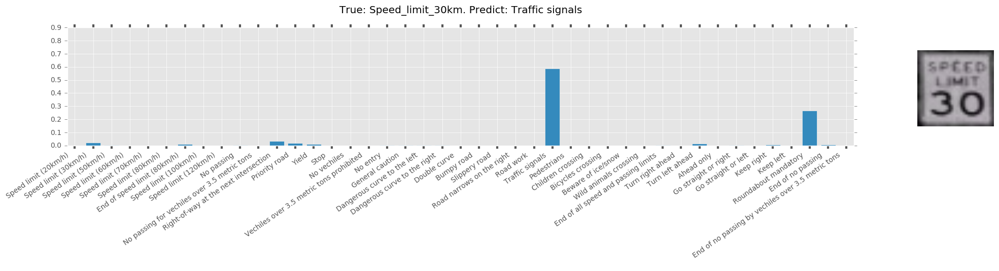

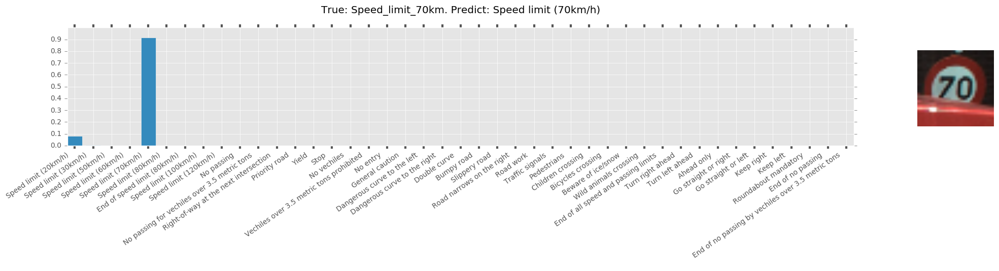

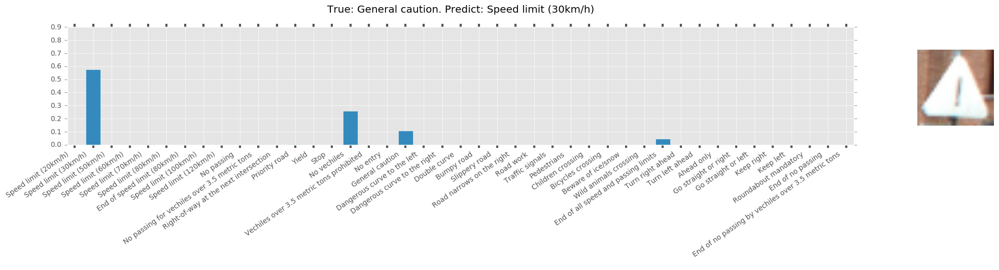

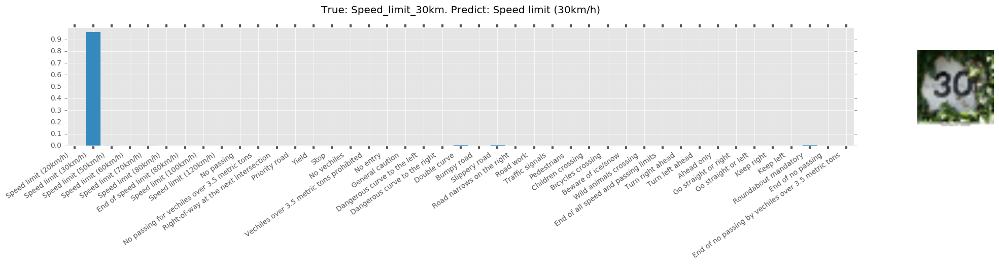

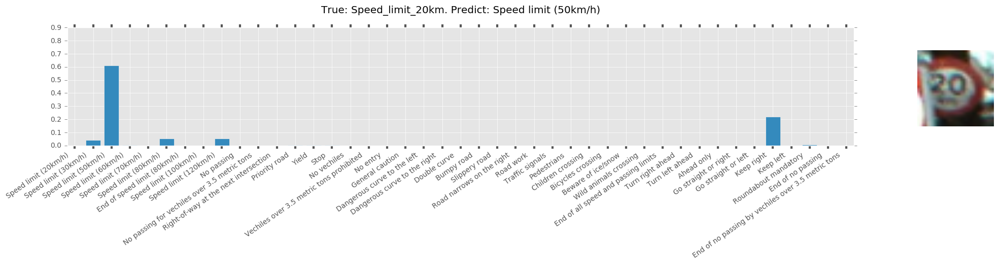

In [24]:
# Visualize the softmax probabilities

for i in range(15):
    fig, ax = plt.subplots(figsize = (20, 3) )
    plt.bar(range(43), prob[i])
    #plt.bar(range(43), np.array([0.3]*43), color = 'g')
    plt.xticks(np.arange(0.4,43.4,1.0), [sign_name[i] for i in range(43)], rotation='35', fontsize = 10, ha = 'right')
    plt.xlim([0,42.8])
    plt.title('True: {0}. Predict: {1}'.format(files[i][11:-6], sign_name[argsort[i,-1]]  ) )
    ax.xaxis.set_tick_params(width=3)
    plt.yticks(np.arange(0,1,0.1), np.arange(0,1,0.1))
    ax = plt.axes([.75,.25,.5,.5], frameon = True)
    ax.imshow(X[i])
    ax.axis('off')

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.